In [1]:
import numpy as np
import matplotlib.pyplot as plt
import _pickle as pkl
import pandas as pd
import os,io,sys,glob, h5py, csv, time
import matplotlib.pyplot as plt
import json

from dlab import generalephys as ephys
from dlab import generalephys_mua as ephys_mua

from dlab import utils_pipeline as utils
#from dlab import utils_mua

from dlab.continuous_traces import gaussian_filter1d
from scipy.signal import find_peaks
from scipy.stats import pearsonr, spearmanr, zscore
from itertools import combinations 
from dlab import sorting_quality_editing as sq
from sklearn.manifold import TSNE
from scipy.cluster.vq import kmeans2
from dlab import preprocessing_pipeline as preprocessing
from dlab import depth_estimation as depth

import seaborn as sns
sns.set_style('white')
%matplotlib inline
%load_ext autoreload
%autoreload 2
sns.set_style("white")
import warnings
warnings.filterwarnings('ignore')

# load chunk of continuous.dat

In [6]:
# file path
cont_file = r'C:\Users\Kim\Desktop\Recordings\2023-02-10_14-06-29_5475\Record Node 115\experiment1\recording1\continuous\Neuropix-PXI-109.ProbeA-AP\continuous.dat'

In [7]:
numChannels = 384

In [8]:
#memory map all 384 channels
rawDataLfp = np.memmap(cont_file, dtype='int16', mode='r')
lfp_data = np.reshape(rawDataLfp, (numChannels,int(rawDataLfp.size/numChannels)))

In [9]:
np.shape(lfp_data)

(384, 113770956)

In [16]:
# choose samples of interest
startPt = 30000 
endPt = startPt + 15000 

In [17]:
# grab chunk of time
chunk = np.copy(lfp_data[:,startPt:endPt])

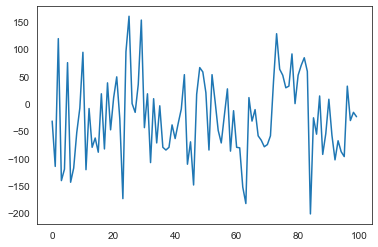

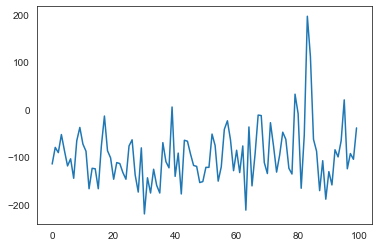

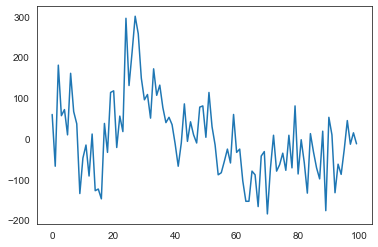

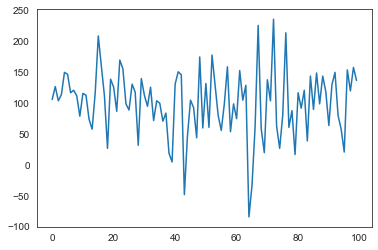

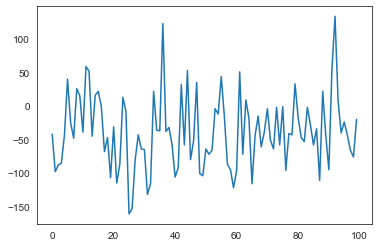

...

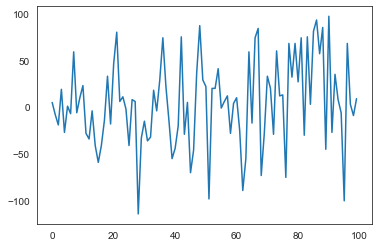

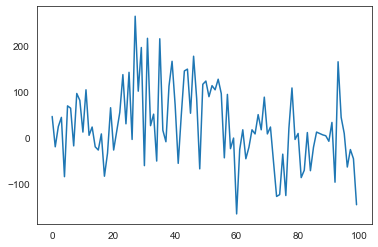

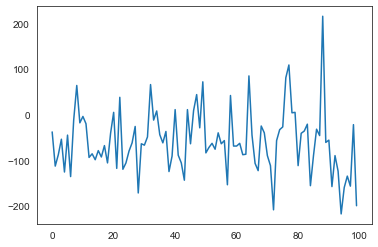

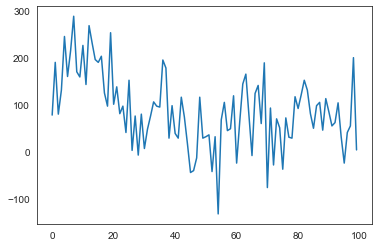

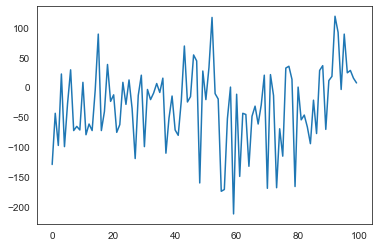

KeyboardInterrupt: 

In [19]:
for i in chunk:
    plt.plot(i[:100])
    plt.show()
    plt.close()

In [34]:
def rolling_rms(x, N):
    return (pd.DataFrame(abs(x)**2).rolling(N).mean()) **0.5

In [20]:
def filterTrace(trace, low, high, sampleHz, order):
    low = float(low)
    high = float(high)
    nyq = 0.5 * sampleHz
    low = low / nyq
    high = high / nyq
    b, a = scipy.signal.butter(order, [low, high], btype='band')
    filtered = scipy.signal.lfilter(b, a, trace)
    return filtered

In [27]:
filt = filterTrace(chunk[:,-1000:],600,6000,30000,2)

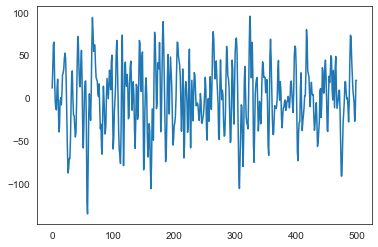

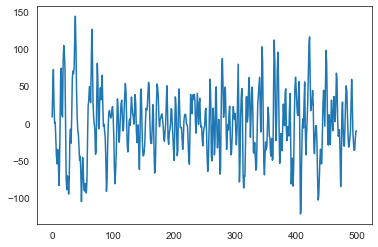

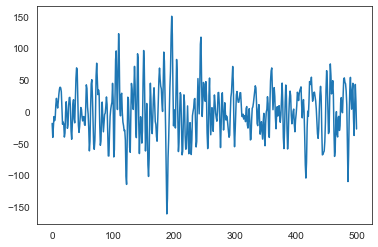

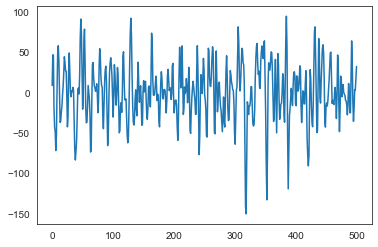

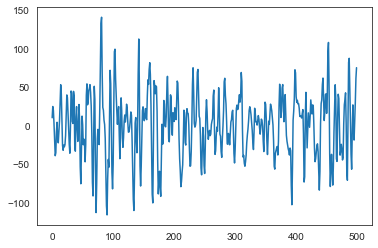

...

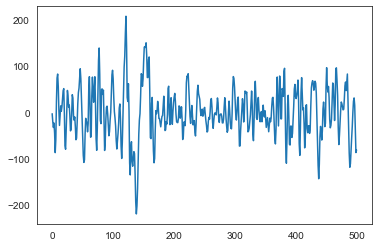

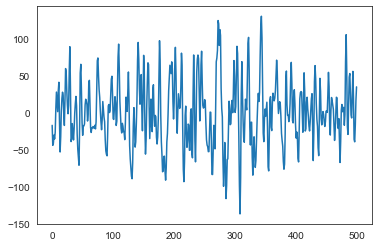

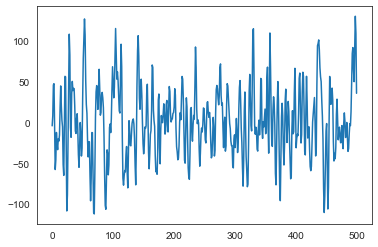

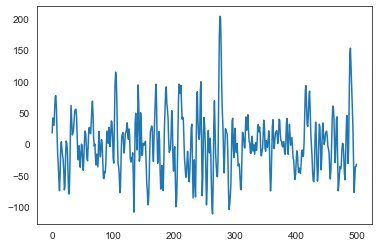

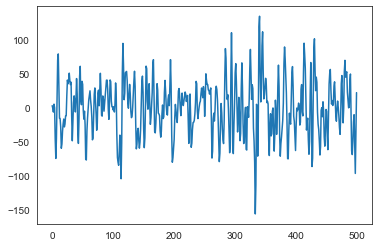

In [29]:
for i in filt:
    plt.plot(i[:500])
    plt.show()
    plt.close()

<AxesSubplot:>

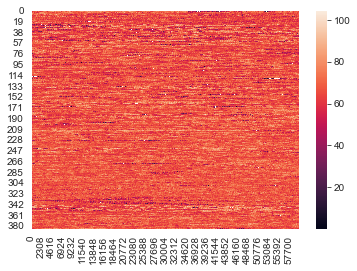

In [35]:
idk = []
for i in chunk:
    rmsd = rolling_rms(i,300)
    rmsd = np.array(rmsd).flatten()
    idk.append(rmsd)
sns.heatmap(idk)

In [ ]:
rms = np.sqrt(np.mean(y**2))

In [20]:
# save to file if you want
save_file = r'C:\Recordings\SortedRecordings\open-ephys-neuropix_CFA_08\2021-11-03_12-25-30\experiment1\recording1\continuous\Neuropix-PXI-100.0\truncated\truncated_again\truncated_channels\continuous_bottomchannels_truncated_.dat'

In [21]:
# save
file = open(save_file,"wb")
file.write(test)
file.close()

In [15]:
np.shape(chunk)

(35970000, 160)

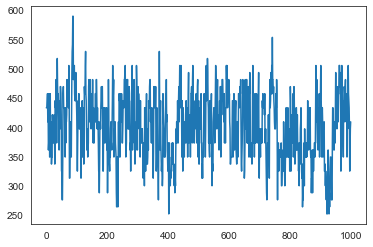

In [10]:
plt.plot(chunk[:1000,18])

In [24]:
from scipy.signal import welch
from scipy.ndimage.filters import gaussian_filter1d

from dlab.common.utils import find_range, rms, printProgressBar

In [30]:
import scipy

In [41]:
def RMS(data,samplingRate,start=0,window=10,despike=False):
    start = start * samplingRate# sampling rate
    if window == 0:
        window = len(data)
    else:
        window = window * samplingRate # sampling rate
    #chunk = filterTrace(data[start:start+window], 70, 6000, 25000, 3)[200:window]
    chunk = data[int(start):int(start)+int(window)] - np.mean(data[int(start):int(start)+int(window)])
    if despike:
        chunk = despike_trace(chunk,threshold=180)
    return np.sqrt(sum(chunk**2)/float(len(chunk)))

In [12]:
def filterTrace(trace, low, high, sampleHz, order):
    low = float(low)
    high = float(high)
    nyq = 0.5 * sampleHz
    low = low / nyq
    high = high / nyq
    b, a = scipy.signal.butter(order, [low, high], btype='band')
    filtered = scipy.signal.lfilter(b, a, trace)
    return filtered

In [22]:
import scipy

In [1]:
for j,t in enumerate(df_reaches.rMax_t):
    ts = int(30000*t)
    te = int(ts+30000*10)
    behavior = df_reaches.behaviors[j]
    chunk = np.copy(lfp_data[ts:te,160:180])
    #chunk = chunk_all[:,160:180]
    chunk_ = []
    for i in range(20):
        ch = chunk[:,i]
        ch = filterTrace(ch,600,6000,30000,3)
        chunk_.append(ch)

    plt.figure(figsize=(10,4))
    for chan in range(20): plt.plot(np.arange(1,11,1/30000),chunk_[chan]+chan*1000)
    plt.title('reach ' + str(j) + ': ' + str(behavior))
    plt.xlabel('time from reach max (s)')
    plt.ylabel('uV')

NameError: name 'df_reaches' is not defined

In [47]:
g = np.arange(0,16,1)
g = g[::-1]

In [48]:
g

array([15, 14, 13, 12, 11, 10,  9,  8,  7,  6,  5,  4,  3,  2,  1,  0])

In [51]:
df_reaches = df_reaches.set_index(g)

In [53]:
df_reaches

,level_0,index,reachInit,reachMax,reachEnd,stim,end_category,behaviors,mouse,cohort,rMax_t
15,2,2,7627,7634,7721,0,handLost,success,8,CFA,58.372800
14,4,4,57001,57012,57046,0,handLost,success,8,CFA,470.000000
13,7,9,135727,135736,135758,0,noPellet,success,8,CFA,912.472433
12,8,10,147284,147292,147330,0,noPellet,success,8,CFA,989.520233
11,11,13,170271,170279,170303,0,handStop,success,8,CFA,1142.782367
10,13,17,183932,183943,183973,0,handStop,success,8,CFA,1233.884900
9,14,18,195901,195911,195951,0,handStop,success,8,CFA,1313.679633
8,16,20,245669,245682,245721,0,noPellet,success,8,CFA,1645.519867
7,18,22,267425,267439,267490,0,handStop,success,8,CFA,1790.581167
6,19,23,280179,280187,280222,0,noPellet,success,8,CFA,1875.576433


In [2]:
a = np.shape(df_reaches)[0]
b = np.shape((np.arange(1,11,1/30000)))[0]
chunk_ = np.zeros((a,b))
for j,t in enumerate(df_reaches.rMax_t):
    ts = int(30000*t)
    te = int(ts+30000*10)
    behavior = df_reaches.behaviors[j]
    chunk = np.copy(lfp_data[ts:te,176])
    #chunk = chunk_all[:,160:180]
    ch = chunk
    ch = filterTrace(ch,600,6000,30000,3)
    std = np.std(ch)*3
    ch = [std if x<std else x for x in ch]
    chunk_[j,:] = ch
    
chunk_ = np.array(chunk_)
chunk_ = chunk_[::-1]
plt.figure(figsize=(20,10))
for chan in range(16): plt.plot(np.arange(1,11,1/30000),chunk_[chan]+chan*500)
plt.title('success reach response')
plt.xlim(3,10)
plt.xlabel('time from reach max (s)')
plt.ylabel('uV')

NameError: name 'np' is not defined

In [107]:
dfr = df_reaches

In [110]:
df_reaches = dfr[dfr.behaviors!='success'].reset_index()

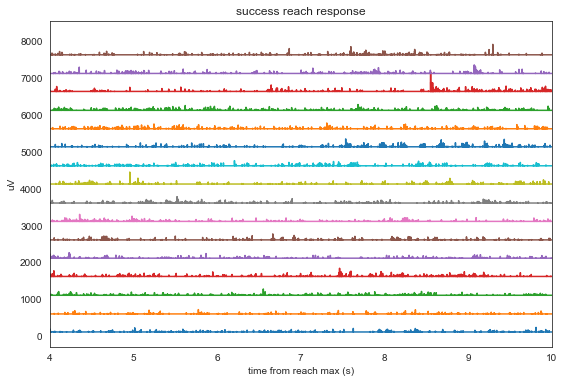

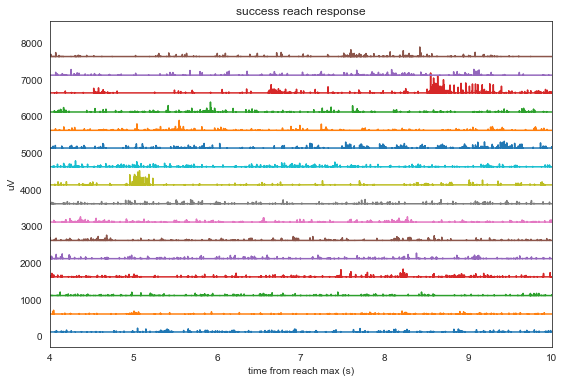

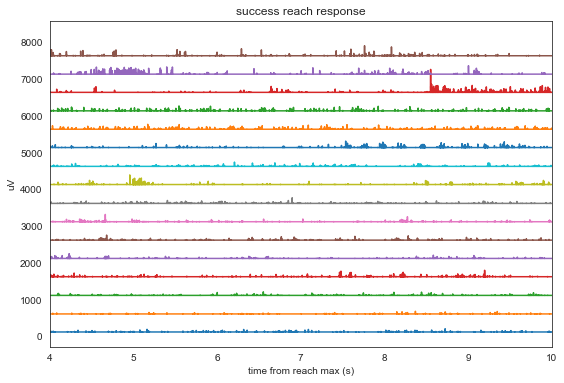

In [111]:
for i in np.arange(169,172,1):
    a = np.shape(df_reaches)[0]
    b = np.shape((np.arange(1,11,1/30000)))[0]
    chunk_ = np.zeros((a,b))
    chunks = []
    for j,t in enumerate(df_reaches.rMax_t):
        ts = int(30000*t)
        te = int(ts+30000*10)
        behavior = df_reaches.behaviors[j]
        chunk = np.copy(lfp_data[ts:te,i])
        #chunk = chunk_all[:,160:180]
        ch = chunk
        ch = filterTrace(ch,600,6000,30000,3)
        std = np.std(ch)*3
        ch = [std if x<std else x for x in ch]
        chunk_[j,:] = ch
    
    chunk_ = np.array(chunk_)
    chunk_ = chunk_[::-1]

    
    plt.figure(figsize=(9,6))
    for chan in range(16): plt.plot(np.arange(1,11,1/30000),chunk_[chan]+chan*500)
    plt.title('success reach response')
    plt.xlim(4,10)
    plt.xlabel('time from reach max (s)')
    plt.ylabel('uV')
    plt.show()
    #plt.savefig(r'C:\Users\Kim\Documents\Data\sorted_dfs\success_chans\test.png')
    #save_path = r'C:\Users\Kim\Documents\Data\sorted_dfs\success_chans'
    #plt.savefig(os.path.join(save_path,'chan'+str(i)+'.png'))
    plt.close()

In [41]:
df_reaches

NameError: name 'df_reaches' is not defined

(10, 300)


Text(0, 0.5, 'uV')

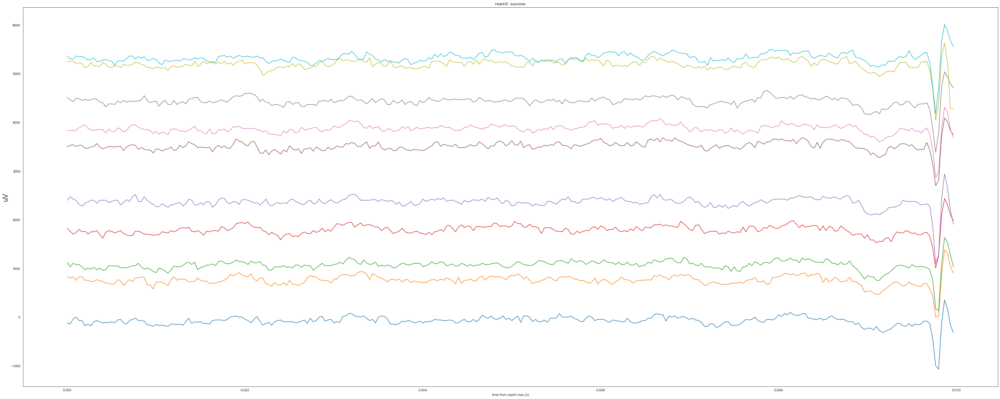

In [74]:
ts = int(30000*917.16)
te = int(ts+30000*0.01)

chunk = np.copy(lfp_data[ts:te,170:180]).T
#chunk = chunk_all[:,160:180]
print(np.shape(chunk))
    
plt.figure(figsize=(50,20))
for chan in range(10): plt.plot(np.arange(0,0.01,1/30000),chunk[chan]+chan*600)
plt.ylabel("channels", fontname="Arial", fontsize=20)
plt.title('reach2: success')
plt.xlabel('time from reach max (s)')
plt.ylabel('uV')

In [178]:
 np.shape(np.zeros(np.shape(chunk[ts:te,i][0]np.shape(chunk[ts:te,:]))))

SyntaxError: invalid syntax (Temp/ipykernel_13700/516462741.py, line 1)

In [186]:
a = np.shape(chunk[ts:te,:])[0]
b = np.shape(chunk[ts:te,:])[1]

(120000, 20)


Text(70.0, 0.5, 'uV')

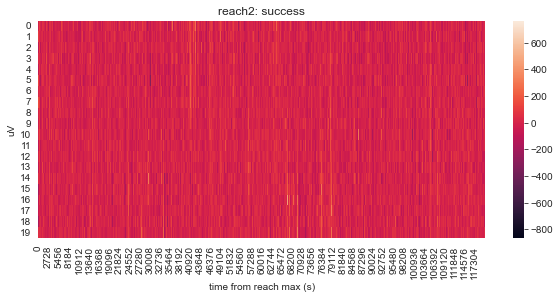

In [200]:
ts = int(30000*62)
te = int(ts+30000*4)

chunk_ = np.zeros((a,b))
print(np.shape(chunk_))
for i in range(20):
    ch = chunk[ts:te,i]
    ch = filterTrace(ch,600,6000,30000,3)
    chunk_[:,i] = ch
    
plt.figure(figsize=(10,4))
#plt.imshow((chunk_).T,aspect='auto')
sns.heatmap((chunk_).T)
plt.title('reach2: success')
plt.xlabel('time from reach max (s)')
plt.ylabel('uV')

Text(0, 0.5, 'uV')

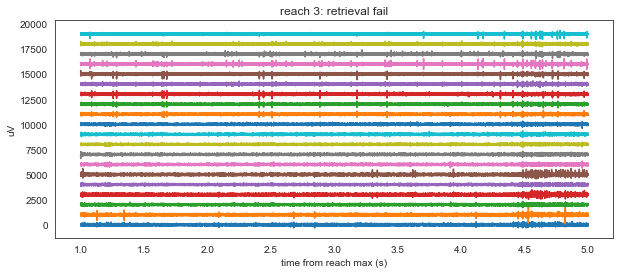

In [42]:
ts = int(30000*333)
te = int(ts+30000*4)

chunk = chunk_all[:,160:180]
chunk_ = []
for i in range(20):
    ch = chunk[ts:te,i]
    ch = filterTrace(ch,600,6000,30000,3)
    chunk_.append(ch)
    
plt.figure(figsize=(10,4))
for chan in range(20): plt.plot(np.arange(1,5,1/30000),chunk_[chan]+chan*1000)
plt.title('reach 3: retrieval fail')
plt.xlabel('time from reach max (s)')
plt.ylabel('uV')

Text(0, 0.5, 'uV')

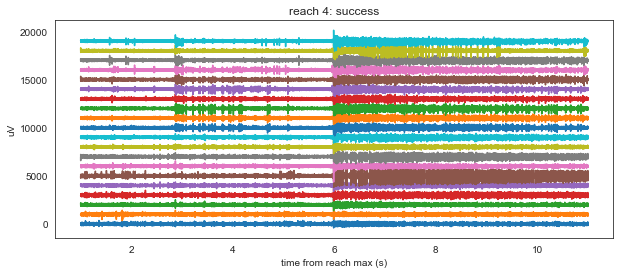

In [22]:
ts = int(30000*470)
te = int(ts+30000*10)

chunk = np.copy(lfp_data[ts:te,160:180]).T
ch = filterTrace(chunk,600,6000,30000,3)
    
plt.figure(figsize=(10,4))
for chan in range(20): plt.plot(np.arange(1,11,1/30000),ch[chan]+chan*1000)
plt.title('reach 4: success')
plt.xlabel('time from reach max (s)')
plt.ylabel('uV')
#plt.gcf().savefig(os.path.join(recording_folder,'figs','flash_evoked_VEP_depth_dark'+str(probe)+'.png'),format='png',dpi=600)

Text(0, 0.5, 'uV')

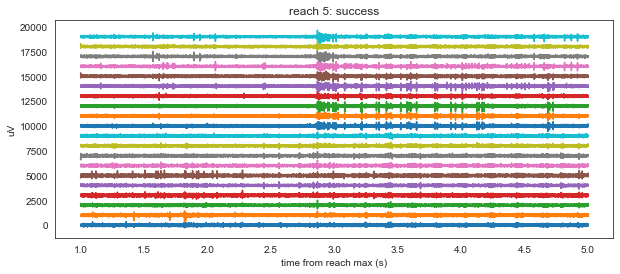

In [44]:
ts = int(30000*470)
te = int(ts+30000*4)

chunk = chunk_all[:,160:180]
chunk_ = []
for i in range(20):
    ch = chunk[ts:te,i]
    ch = filterTrace(ch,600,6000,30000,3)
    chunk_.append(ch)
    
plt.figure(figsize=(10,4))
for chan in range(20): plt.plot(np.arange(1,5,1/30000),chunk_[chan]+chan*1000)
plt.title('reach 5: success')
plt.xlabel('time from reach max (s)')
plt.ylabel('uV')
#plt.gcf().savefig(os.path.join(recording_folder,'figs','flash_evoked_VEP_depth_dark'+str(probe)+'.png'),format='png',dpi=600)

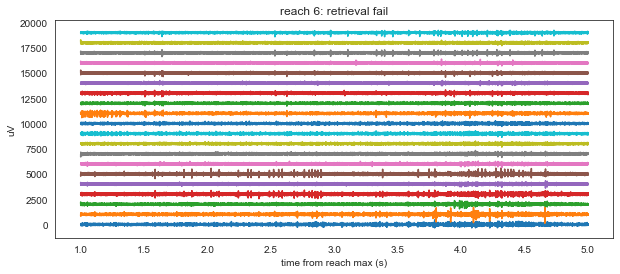

In [57]:
ts = int(30000*843)
te = int(ts+30000*4)

chunk = chunk_all[:,160:180]
chunk_ = []
for i in range(20):
    ch = chunk[ts:te,i]
    ch = filterTrace(ch,600,6000,30000,3)
    chunk_.append(ch)
    
plt.figure(figsize=(10,4))
for chan in range(20): plt.plot(np.arange(1,5,1/30000),chunk_[chan]+chan*1000)
title = 'reach 6: retrieval fail'
plt.title(str(title))
plt.xlabel('time from reach max (s)')
plt.ylabel('uV')
recording_folder = r'C:\Recordings\SortedRecordings\open-ephys-neuropix_CFA_08\2021-11-03_12-25-30\experiment1\recording1\continuous\Neuropix-PXI-100.0\truncated\truncated_again'
plt.gcf().savefig(os.path.join(recording_folder,'figs',str(title) + '.png'),fo4rmat='png',dpi=600)

Text(0, 0.5, 'uV')

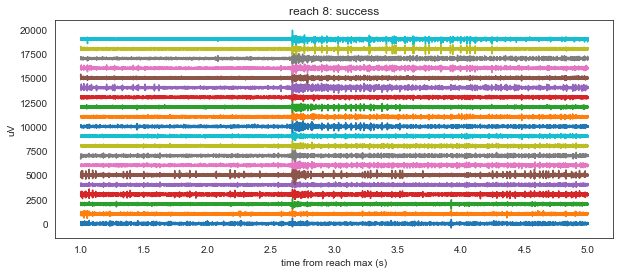

In [50]:
ts = int(30000*915.5)
te = int(ts+30000*4)

chunk = chunk_all[:,160:180]
chunk_ = []
for i in range(20):
    ch = chunk[ts:te,i]
    ch = filterTrace(ch,600,6000,30000,3)
    chunk_.append(ch)
    
plt.figure(figsize=(10,4))
for chan in range(20): plt.plot(np.arange(1,5,1/30000),chunk_[chan]+chan*1000)
plt.title('reach 8: success')
plt.xlabel('time from reach max (s)')
plt.ylabel('uV')

Text(0, 0.5, 'uV')

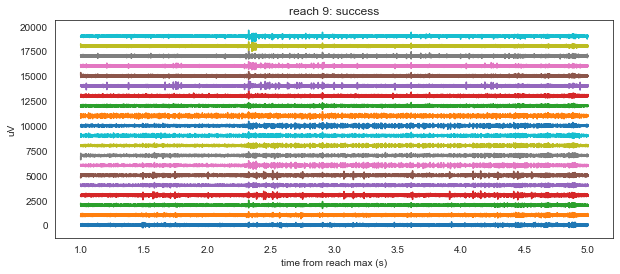

In [58]:
ts = int(30000*992)
te = int(ts+30000*4)

chunk = chunk_all[:,160:180]
chunk_ = []
for i in range(20):
    ch = chunk[ts:te,i]
    ch = filterTrace(ch,600,6000,30000,3)
    chunk_.append(ch)
    
plt.figure(figsize=(10,4))
for chan in range(20): plt.plot(np.arange(1,5,1/30000),chunk_[chan]+chan*1000)
plt.title('reach 9: success')
plt.xlabel('time from reach max (s)')
plt.ylabel('uV')

Text(0, 0.5, 'uV')

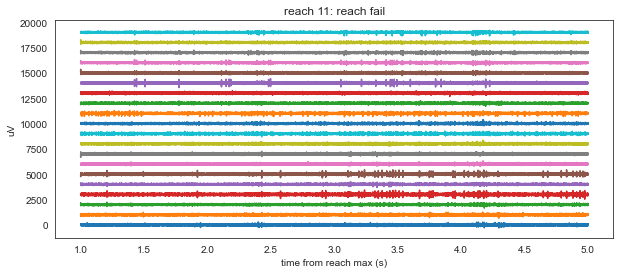

In [55]:
ts = int(30000*1110)
te = int(ts+30000*4)

chunk = chunk_all[:,160:180]
chunk_ = []
for i in range(20):
    ch = chunk[ts:te,i]
    ch = filterTrace(ch,600,6000,30000,3)
    chunk_.append(ch)
    
plt.figure(figsize=(10,4))
for chan in range(20): plt.plot(np.arange(1,5,1/30000),chunk_[chan]+chan*1000)
plt.title('reach 11: reach fail')
plt.xlabel('time from reach max (s)')
plt.ylabel('uV')

Text(0, 0.5, 'uV')

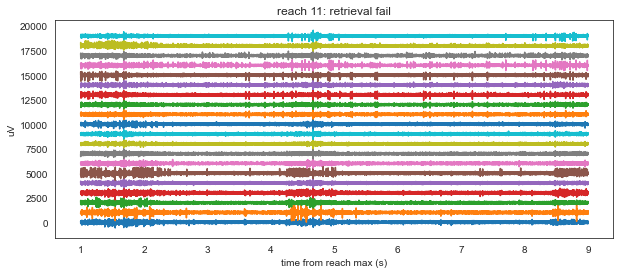

In [80]:
ts = int(30000*329)
te = int(ts+30000*8)

chunk = chunk_all[:,160:180]
chunk_ = []
for i in range(20):
    ch = chunk[ts:te,i]
    ch = filterTrace(ch,600,6000,30000,3)
    chunk_.append(ch)
    
plt.figure(figsize=(10,4))
for chan in range(20): plt.plot(np.arange(1,9,1/30000),chunk_[chan]+chan*1000)
plt.title('reach 11: retrieval fail')
plt.xlabel('time from reach max (s)')
plt.ylabel('uV')